In [3]:
import sys
import os
sys.path.append(os.path.abspath(".."))
sys.path.append(os.path.abspath("."))

In [4]:
!ls

__pycache__		       regularizers.py
analysis.ipynb		       results
config_2D_classification.yaml  run_single_experiment.py
dev.ipynb		       task_performance_comparison.png
dev_probing.ipynb	       training.py
figures			       utils_io.py
launcher.sh		       utils_landscape.py
logs			       utils_math.py
migrate_filesystem.py	       utils_monitor.py
notes


In [5]:
import utils_io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import yaml
import json
import torch
from tqdm.notebook import tqdm
# --- Import our custom modules ---
# Use autoreload to pick up changes in .py files without restarting kernel
%load_ext autoreload
%autoreload 2


# --- Matplotlib Aesthetics Settings ---
plt.rcParams.update({
    "figure.dpi": 300,
    "savefig.dpi": 300,
    "font.family": "serif",
    "axes.titlesize": 18,
    "axes.labelsize": 16,
    "legend.fontsize": 12,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "axes.edgecolor": "black",
    "axes.linewidth": 1,
    'grid.alpha': 0.5,
    'grid.color': '#c0c0c0',
    'grid.linestyle': '--',
    'grid.linewidth': 0.8,
    'figure.dpi': 300,
    'figure.edgecolor': 'black',
    'figure.facecolor': 'white',
    'figure.figsize': [6, 5],
})

In [6]:
# Metrics from task_metrics['landscape']
L_metrics = [
    "sharpness_curr", "trace_curr", 
    "grad_norm_reg", "grad_norm_task", "reg_rank"
]

M_metrics = ['kappa_loss', 'kappa_grad', 'grad_cos_sim', 'accuracy']

# Metrics from task_metrics['performance'] (Live training stats)
P_metrics = ["avg_task_loss", "avg_reg_loss", "train_batch_acc"]

# Metrics from task_metrics['performance'] (Nested Systematic Eval)
# Format: {split}_{category}
G_metrics = [
    "test_current", "test_avg_past", "test_avg_future", "test_avg_total",
    "train_current", "train_avg_past", "train_avg_future", "train_avg_total", 
]

In [7]:
ROOT_DIR = './results/study_q2approx_v1'

In [8]:
def filter_index(index, filters):
    """
    General-purpose filter for experiment results.
    Args:
        index (list): List of experiment dicts.
        filters (dict): Key-value pairs to match. 
                        e.g. {'mode': 'regularized', 'spectral_override': True}
    """
    matches = []
    for item in index:
        is_match = True
        cfg = item.get('config', {})
        
        for key, target_val in filters.items():
            # 1. Try finding key in top-level item (metrics.pt metadata)
            # 2. Try finding key in item['config'] (original config.json)
            # 3. Default to None if not found
            found_val = item.get(key, cfg.get(key, None))
            
            # Special handling for booleans (missing often implies False)
            if target_val is False and found_val is None:
                found_val = False
            
            # Comparison
            # We convert to string for robust comparison (e.g. if one is '1.0' and other is 1.0)
            # but usually direct comparison is fine.
            if found_val != target_val:
                is_match = False
                break
        
        if is_match:
            matches.append(item)
            
    return matches

In [9]:
def get_experiment_index(root_dir):
    configs = []
    files = glob.glob(os.path.join(root_dir, '**', 'config.yaml'), recursive=True)
    
    print(f"Indexing {len(files)} experiments...")
    for f in files:
        try:
            with open(f, 'r') as stream:
                cfg = yaml.safe_load(stream)
            
            configs.append({
                'config': cfg,
                'metrics_path': os.path.join(os.path.dirname(f), 'metrics.pt'),
                'mode': cfg.get('training_mode', 'unknown'),
                'reg_type': cfg.get('reg_type'),
                'seed': cfg.get('seed'),
                'curvature': cfg.get('curvature_type', 'fisher'),
                'accumulate': cfg.get('accumulate', False),
                'data_relationship': cfg.get('data_relationship', 'independent') , 
                'ignore_gradient': cfg.get('ignore_gradient', False),
                'spectral_override': cfg.get('spectral_override', False),
                'alpha': cfg.get('alpha', 1.0),
                'projection': cfg.get('projection', False),
                'reg_frac': cfg.get('reg_frac', 1.0),
                'replay_frac': cfg.get('replay_frac', 0.0)
            })
        except Exception: continue
    return configs

In [59]:
def extract_trajectory_series(results, config, metric_root):
    num_steps = config['num_steps']
    num_tasks = config['environment_args']['num_tasks']
    steps_axis, vals_stale, vals_fresh = [], [], []

    for t in range(num_tasks):
        if t not in results: continue
        task_data = results[t]
        offset = t * num_steps

        # --- A. Handle Vector Metrics (Alignments/Projections) ---
        # --- Vector Metrics (Alignments) ---
        if metric_root in ['alignments_with_top_eigs', 'projections_along_top_eigs']:
            alignment_history = task_data.get(metric_root, [])

            # IF TASK 0 IS EMPTY: Pad it with zeros so the trajectory starts at Step 1
            if t == 0 and not alignment_history:
                # Assuming alignment is logged at the same frequency as performance
                for i in range(num_steps):
                    step = ((i + 1)) + offset
                    steps_axis.append(step)
                    # Pad with a list of zeros of length K
                    zero_vec = [0.0] * 10
                    vals_stale.append(zero_vec)
                    vals_fresh.append(zero_vec)
            else:
                # Normal processing for tasks that have data
                for i, step_values in enumerate(alignment_history):
                    step = ((i + 1)) + offset
                    steps_axis.append(step)
                    vals_stale.append(step_values)
                    vals_fresh.append(step_values)

            continue

        # --- B. Route Standard Metrics to the correct bucket ---
        if any(k in metric_root for k in ['kappa', 'cos_sim', 'accuracy']):
            bucket = 'history'
        elif any(k in metric_root for k in ['sharpness', 'grad_norm', 'energy_frac']):
            bucket = 'landscape'
        else:
            bucket = 'performance'

        data_list = task_data.get(bucket, [])

        for i, entry in enumerate(data_list):
            # --- C. Step Calculation ---
            if bucket == 'performance':
                step = entry.get('step', 0) + offset
            elif bucket == 'landscape':
                l_int = config.get('log_every_n_steps', 1) * config.get('landscape_interval', 1)
                step = (i * l_int) + offset
            else: # History
                step = (i + 1) + offset

            # --- D. Value Extraction ---
            v_s, v_f = np.nan, np.nan

            if bucket == 'history':
                # entry is a LIST of sample dicts. Average them.
                if metric_root in entry[0]:
                    val = [s.get(metric_root, np.nan) for s in entry]
                    v_s, v_f = val, val
                else: 
                    # Kappa metrics have _acc and _res versions
                    v_s = [s.get(f"{metric_root}_acc", np.nan) for s in entry]
                    v_f = [s.get(f"{metric_root}_res", np.nan) for s in entry]
                
                if metric_root == 'kappa_loss':
                    v_s = [abs(x) if not np.isnan(x) else np.nan for x in v_s]
                    v_f = [abs(x) if not np.isnan(x) else np.nan for x in v_f]
                
                v_s = np.mean(v_s)
                v_f = np.mean(v_f)

            elif bucket == 'performance':
                if metric_root in entry:
                    val = entry.get(metric_root)
                elif '_' in metric_root:
                    parts = metric_root.split('_')
                    top_key = parts[0]
                    sub_key = "_".join(parts[1:])
                    val = entry.get(top_key, {}).get(sub_key, np.nan)
                else:
                    val = np.nan
                v_s, v_f = val, val

            elif bucket == 'landscape':
                val = entry.get(metric_root, np.nan)
                v_s, v_f = val, val

            steps_axis.append(step)
            vals_stale.append(v_s)
            vals_fresh.append(v_f)

    # Return after all tasks have been processed
    return np.array(steps_axis), np.array(vals_stale, dtype=object), np.array(vals_fresh, dtype=object)

# Dataframe extractions

In [55]:
import torch
import pandas as pd
import numpy as np
import os

def collect_results_to_df(filtered_index, metrics_to_collect):
    all_rows = []
    
    for exp in filtered_index:
        if not os.path.exists(exp['metrics_path']): continue
        try:
            results_data = torch.load(exp['metrics_path'], map_location='cpu', weights_only=False)
        except: 
            continue
        cfg = exp['config']
        
        # Metadata block (kept exactly as you had it)
        metadata = {
            'strategy': 'accumulate' if cfg.get('accumulate') else 'refresh',
            'mode': cfg['training_mode'],
            'curvature': cfg.get('curvature_type', 'fisher'),
            'data_rel': cfg.get('data_relationship', 'independent'),
            'seed': cfg['seed'],
            'reg_type': cfg['reg_type'],
            'data_relationship': cfg.get('data_relationship', 'independent'),
            'ignore_gradient': cfg.get('ignore_gradient', False),
            'spectral_override': cfg.get('spectral_override', False),
            'alpha': cfg.get('alpha', 1.0),
            'projection': cfg.get('projection', False),
            'reg_frac': cfg.get('reg_frac', 1.0),
            'replay_frac': cfg.get('replay_frac', 0.0)
        }

        # 1. Extraction: Store as {metric_name: {step: (stale_val, fresh_val)}}
        # This prevents IndexError because we map values to steps directly
        extracted_lookup = {}
        all_unique_steps = set()
        step_to_task_id = {} # Map to store task index from data

        for m_root in metrics_to_collect:
            steps, v_s, v_f = extract_trajectory_series(results_data, cfg, m_root)
            if len(steps) > 0:
                # Create a lookup for this specific metric
                extracted_lookup[m_root] = {
                    s: (vs, vf) for s, vs, vf in zip(steps, v_s, v_f)
                }
                all_unique_steps.update(steps)


        # 2. Extract Task IDs from 'performance' logs (as requested)
        for t_idx, task_data in results_data.items():
            if not isinstance(t_idx, int): continue
            offset = t_idx * cfg['num_steps']
            for entry in task_data.get('performance', []):
                g_step = entry.get('step', 0) + offset
                step_to_task_id[g_step] = entry.get('task', t_idx)

        if not all_unique_steps: 
            continue

        # 3. Build rows by iterating through the Master Step List
        for step in sorted(list(all_unique_steps)):
            # Determine task_id from the 'task' variable, fallback to calculation if missing
            current_task_id = step_to_task_id.get(step, int(step // cfg['num_steps']))
            
            for approx in ['stale', 'fresh']:
                row = metadata.copy()
                row.update({
                    'step': step, 
                    'approx_type': approx, 
                    'task_idx': current_task_id
                })
                
                # Fill metrics: Use values if step exists for this metric, else NaN
                for m_root in metrics_to_collect:
                    vals = extracted_lookup.get(m_root, {}).get(step)
                    if vals is not None:
                        # index 0 is stale, index 1 is fresh
                        row[m_root] = vals[0] if approx == 'stale' else vals[1]
                    else:
                        row[m_root] = np.nan # Quantity not present at this step
                
                all_rows.append(row)

    return pd.DataFrame(all_rows)

In [13]:
# Index everything
full_index = get_experiment_index("./results")
# 1. Define the updated metrics list
# We use the systematic test set metrics we just implemented
metrics = ['test_avg_past', 'test_current', 'accuracy', 'kappa_loss', 'kappa_grad']

# 2. Filter for the specific experiment setup
# Note: Ensure these keys match what get_experiment_index() extracts
my_filters = {
    'mode': 'regularized',
    'reg_type': 'taylor-full',
    'curvature': 'true_fisher', 
    'ignore_gradient': True,
    'alpha': 1.0
    # 'data_rel': 'independent' # Optional: filter by data overlap strategy
}

filtered = filter_index(full_index, my_filters)
sub_df = collect_results_to_df(filtered, metrics)

# --- STATS CALCULATION ---

# 3. Calculate "Last Step" Stats
# Find the final step recorded for each seed
last_step_idx = sub_df.groupby(['strategy', 'seed', 'approx_type'])['step'].idxmax()
df_last = sub_df.loc[last_step_idx]

# Aggregate across seeds (Grouping by strategy: Accumulate vs Refresh)
stats_last = df_last.groupby(['strategy', 'approx_type'])[metrics].agg(['mean', 'std'])

# 4. Calculate "Trajectory Average" Stats
# First: Average across steps for EACH seed individually
traj_means_per_seed = sub_df.groupby(['strategy', 'approx_type', 'seed'])[metrics].mean().reset_index()

# Second: Aggregate those seed-means across seeds
stats_traj = traj_means_per_seed.groupby(['strategy', 'approx_type'])[metrics].agg(['mean', 'std'])

# 5. Combine into one summary table
summary = pd.concat([stats_last, stats_traj], axis=1, keys=['Final Step', 'Trajectory Avg'])

# Cleanup: Keep only the specific Strategy/Approx pairs we care about
# Accumulate -> Stale (how it actually ran)
# Refresh -> Fresh (how it actually ran)
final_table = summary.loc[[('accumulate', 'stale'), ('refresh', 'fresh')]]

print(final_table.round(4))

Indexing 219 experiments...
                          Final Step                                        \
                       test_avg_past         test_current         accuracy   
                                mean     std         mean     std     mean   
strategy   approx_type                                                       
accumulate stale              0.6800  0.0353        0.905  0.1370   0.6750   
refresh    fresh              0.7106  0.0262        0.790  0.1206   0.7141   

                                                                      \
                               kappa_loss         kappa_grad           
                           std       mean     std       mean     std   
strategy   approx_type                                                 
accumulate stale        0.0786     3.6400  1.2341     8.4216  1.4212   
refresh    fresh        0.0355     0.0499  0.0344     7.3697  0.6808   

                       Trajectory Avg                                 

In [14]:
# 1. Index everything
full_index = get_experiment_index("./results")
metrics = ['test_avg_past', 'test_current', 'accuracy', 'kappa_loss', 'kappa_grad']

# 2. Broaden filters to include all matrix/curvature variations
# We only filter for the mode and the ignore_gradient setting
my_filters = {
    'mode': 'regularized',
    'ignore_gradient': True
}

filtered = filter_index(full_index, my_filters)
sub_df = collect_results_to_df(filtered, metrics)

# --- STATS CALCULATION ---

# 3. Calculate "Last Step" Stats
# Grouping now includes reg_type (Full/Block/Diag) and curvature (Fisher/True Fisher)
grouping_cols = ['reg_type', 'curvature', 'strategy', 'approx_type']

last_step_idx = sub_df.groupby(grouping_cols + ['seed'])['step'].idxmax()
df_last = sub_df.loc[last_step_idx]

stats_last = df_last.groupby(grouping_cols)[metrics].agg(['mean', 'std'])

# 4. Calculate "Trajectory Average" Stats
traj_means_per_seed = sub_df.groupby(grouping_cols + ['seed'])[metrics].mean().reset_index()
stats_traj = traj_means_per_seed.groupby(grouping_cols)[metrics].agg(['mean', 'std'])

# 5. Combine into one summary table
summary = pd.concat([stats_last, stats_traj], axis=1, keys=['Final Step', 'Trajectory Avg'])

# 6. Cleanup and Formatting
# We want to look at the valid "runs": Stale (Accumulate) and Fresh (Refresh)
# We use .query to filter the multi-index rows efficiently
final_table = summary.reset_index()
final_table = final_table[
    ((final_table['strategy'] == 'accumulate') & (final_table['approx_type'] == 'stale')) |
    ((final_table['strategy'] == 'refresh') & (final_table['approx_type'] == 'fresh'))
]

# Set the index to make the matrix comparison obvious
final_table = final_table.set_index(['reg_type', 'curvature', 'approx_type']).sort_index()

# Drop the 'strategy' column as it's now redundant with 'approx_type'
final_table = final_table.drop(columns=['strategy'])

print(final_table.round(4))

Indexing 143 experiments...
                                        Final Step                       \
                                     test_avg_past         test_current   
                                              mean     std         mean   
reg_type     curvature   approx_type                                      
taylor-block fisher      fresh              0.6919  0.0255        0.865   
                         stale              0.6881  0.0121        0.965   
             true_fisher fresh              0.7125  0.0054        0.905   
                         stale              0.6733  0.0166        0.980   
taylor-diag  fisher      fresh              0.6388  0.0244        0.945   
                         stale              0.6350  0.0278        0.940   
             true_fisher fresh              0.6688  0.0347        0.965   
                         stale              0.6519  0.0324        0.950   
taylor-full  fisher      fresh              0.6762  0.0525        0.945 

/tmp/ipykernel_295298/2027270350.py:46: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  final_table = final_table.drop(columns=['strategy'])


In [45]:


# 1. Define the metrics for general training performance
# We'll include the ones you requested + total accuracy for a bird's-eye view
metrics = ['test_avg_past', 'test_current', 'accuracy', 'kappa_loss', 'kappa_grad']


# 2. General Indexing (No 'mode' filter this time)
full_index = get_experiment_index("./results")

# We apply broad filters that apply to ALL modes (like seed or data relationship)
# but we LEAVE OUT 'mode' and 'reg_type' to allow comparison.
comparison_filters = {
    'curvature': 'true_fisher', 
    'reg_type': 'taylor-full',
    'ignore_gradient': True,
}

filtered = filter_index(full_index, comparison_filters)
df_all = collect_results_to_df(filtered, metrics)

# 3. Calculate "Final Step" Stats
# We group by mode to see how Replay vs Regularized compare at the end
last_step_idx = df_all.groupby(['mode', 'strategy', 'seed', 'approx_type'])['step'].idxmax()
df_last = df_all.loc[last_step_idx]

stats_last = df_last.groupby(['mode', 'strategy', 'approx_type'])[metrics].agg(['mean', 'std'])

# 4. Calculate "Trajectory Average" Stats (Performance over the whole life of the model)
traj_means_per_seed = df_all.groupby(['mode', 'strategy', 'approx_type', 'seed'])[metrics].mean().reset_index()
stats_traj = traj_means_per_seed.groupby(['mode', 'strategy', 'approx_type'])[metrics].agg(['mean', 'std'])

# 5. Combine and Filter for Relevant Comparisons
summary = pd.concat([stats_last, stats_traj], axis=1, keys=['Final Step', 'Trajectory Avg'])

# Define which rows represent the "real" performance of each mode:
# - Regularized: Needs the 'accumulate/stale' version (what happened in training)
# - Replay/Sequential: Stale/Fresh are identical, so we just pick one.
comparison_index = [
    ('regularized', 'accumulate', 'stale'),
    ('regularized', 'refresh', 'fresh'),
    ('replay', 'accumulate', 'stale'),
    ('sequential', 'accumulate', 'stale')
]

# Use .loc with a list of tuples to grab exactly these configurations
# We use 'intersection' in case some modes (like sequential) haven't been run yet
valid_index = [i for i in comparison_index if i in summary.index]
final_table = summary.loc[valid_index]

print("\n--- Cross-Mode Performance Comparison ---")
print(final_table.round(3).to_string())

Indexing 143 experiments...

--- Cross-Mode Performance Comparison ---
                                      Final Step                                                                                Trajectory Avg                                                                               
                                   test_avg_past        test_current        accuracy        kappa_loss        kappa_grad         test_avg_past        test_current        accuracy        kappa_loss        kappa_grad       
                                            mean    std         mean    std     mean    std       mean    std       mean    std           mean    std         mean    std     mean    std       mean    std       mean    std
mode        strategy   approx_type                                                                                                                                                                                           
regularized accumulate stale             

## Alignment to top eigenvectors

In [75]:
# 1. Setup and Filtering (Added alpha to the collection)
full_index = get_experiment_index("./results")

my_filters = {
    'mode': 'regularized',
    'reg_type': 'taylor-full',
    'curvature': 'true_fisher', 
    'ignore_gradient': True
}

filtered = filter_index(full_index, my_filters)

# Performance columns to track
perf_cols = ['test_avg_past', 'test_current','kappa_loss', 'kappa_grad', 'energy_frac']
# Collect alignments AND performance metrics
# (Assuming your results dict has 'test_avg_past' and 'test_current')
metrics_to_fetch = ['alignments_with_top_eigs', 'projections_along_top_eigs'] + perf_cols
sub_df = collect_results_to_df(filtered, metrics_to_fetch)

# 2. Process Alignment Vectors
k_values = [1, 10, 100]
align_cols = []
for k in k_values:
    col_name = f'avg_top_{k}'
    align_cols.append(col_name)
    sub_df[col_name] = sub_df['alignments_with_top_eigs'].apply(
        lambda x: np.mean(x[:k]) if isinstance(x, (list, np.ndarray)) and len(x) >= k else np.nan
    )
proj_cols = []
for k in k_values:
    col_name = f'avg_top_{k}_proj'
    proj_cols.append(col_name)
    sub_df[col_name] = sub_df['projections_along_top_eigs'].apply(
        lambda x: np.mean(x[:k]) if isinstance(x, (list, np.ndarray)) and len(x) >= k else np.nan
    )

alignments_df = sub_df
all_metrics = align_cols + perf_cols + proj_cols

# --- STATS CALCULATION ---

# 3. Final Step Stats (Subspace quality + Final Performance)
# We group by alpha as well to differentiate the sweep
grouping_keys = ['strategy', 'approx_type', 'alpha']
num_steps = filtered[0]['config']['num_steps']
num_tasks = filtered[0]['config']['environment_args']['num_tasks']
total_final_step = num_steps * num_tasks

# 2. Instead of idxmax(), filter for that exact step
df_last = sub_df[sub_df['step'] == total_final_step -1].copy()

# Aggregate across seeds
stats_last = df_last.groupby(grouping_keys)[all_metrics].agg(['mean', 'std'])

# 4. Trajectory Average Stats (Stability throughout training)
traj_means_per_seed = sub_df.groupby(grouping_keys + ['seed'])[all_metrics].mean().reset_index()
stats_traj = traj_means_per_seed.groupby(grouping_keys)[all_metrics].agg(['mean', 'std'])

# 5. Combine into Final Summary Table
summary = pd.concat([stats_last, stats_traj], axis=1, keys=['Final Step', 'Trajectory Avg'])

# 6. Filter for Relevant Experimental Pairs
# We keep alpha in the index so we can see the sweep results
final_table = summary.query(
    "(strategy == 'accumulate' and approx_type == 'stale') or "
    "(strategy == 'refresh' and approx_type == 'fresh')"
)

print("Comprehensive Sweep Results (Alignment):")
# Sort by alpha to make the trend visible
print(final_table.sort_index(level='alpha').round(4).to_string())

Indexing 229 experiments...
Comprehensive Sweep Results (Alignment):
                             Final Step                                                                                                                                                                                                                          Trajectory Avg                                                                                                                                                                                                                         
                              avg_top_1         avg_top_10         avg_top_100         test_avg_past         test_current         kappa_loss         kappa_grad         energy_frac      avg_top_1_proj         avg_top_10_proj         avg_top_100_proj              avg_top_1         avg_top_10         avg_top_100         test_avg_past         test_current         kappa_loss         kappa_grad         energy_frac      avg_top_1_proj         av

## Plotting with dataframes 

In [72]:


def save_plot(df, y_metric, title, filename, steps_per_task=None, palette=None):
    """
    Generic plotting function for a single metric across global steps.
    """
    plt.figure(figsize=(10, 5), dpi=300)
    
    ax = sns.lineplot(
        data=df,
        x='step',
        y=y_metric,
        hue='Method',
        palette=palette,
        errorbar='sd',
        linewidth=1
    )

    # Add Task Boundaries
    if steps_per_task:
        max_step = df['step'].max()
        for t_step in range(0, int(max_step) + 1, steps_per_task):
            plt.axvline(x=t_step, color='black', linestyle='--', alpha=0.2)

    plt.title(title, fontsize=14, pad=15)
    plt.xlabel("Global Training Steps", fontsize=12)
    plt.ylabel(y_metric.replace('_', ' ').title(), fontsize=12)
    plt.legend(title="Method", loc='lower center', bbox_to_anchor=(1.1, 0.1), ncol=1, frameon=True, fontsize=10)
    plt.tight_layout()
    
    # Save as high-quality PDF
    plt.savefig(f"{filename}.pdf", format='pdf', dpi=300, bbox_inches='tight')
    plt.show()


In [77]:

# --- Execution ---

# 1. Collect and Identify Methods
index = get_experiment_index("./results")
# metrics = ['train_avg_past','test_avg_past','train_current', 'test_current']
# comparison_filters = {
#     'curvature': 'true_fisher', 
#     'reg_type': 'taylor-full',
#     'ignore_gradient': True,
#     'mode' : 'regularized'
# }

# filtered = filter_index(index, comparison_filters)
# full_df = collect_results_to_df(filtered, metrics)

full_df = alignments_df

def identify_method(row):
    m, s, a = row['mode'], row['strategy'], row['approx_type']
    if m == 'sequential': return 'Sequential'
    if m == 'replay':     return 'Replay'
    if m == 'regularized' and s == 'refresh' and a == 'fresh':
        return 'Regularization'
    return None

# 2. Update Labeling Logic
# We want to see: "Fresh (α=100)", "Stale (α=10)", etc.
def identify_regularization_sweep(row):
    approx = row['approx_type'].capitalize()
    alpha = row['alpha']
    return f"{approx} (α={alpha})"

# full_df['Method'] = full_df.apply(identify_method, axis=1)
full_df['Method'] = full_df.apply(identify_regularization_sweep, axis=1)
plot_df = full_df[full_df['Method'].notnull()].copy()

# 2. Get steps_per_task from config for the vertical lines
steps_per_task = index[0]['config']['num_steps']

Indexing 229 experiments...


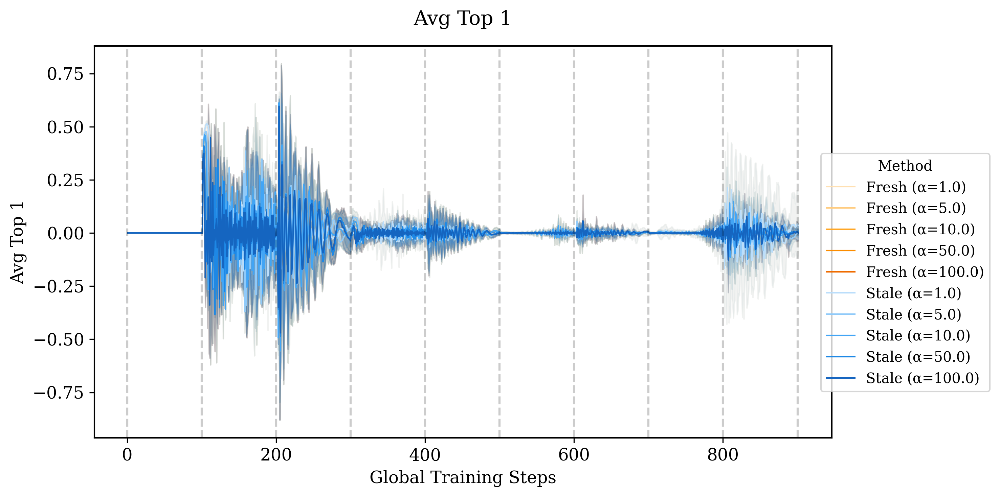

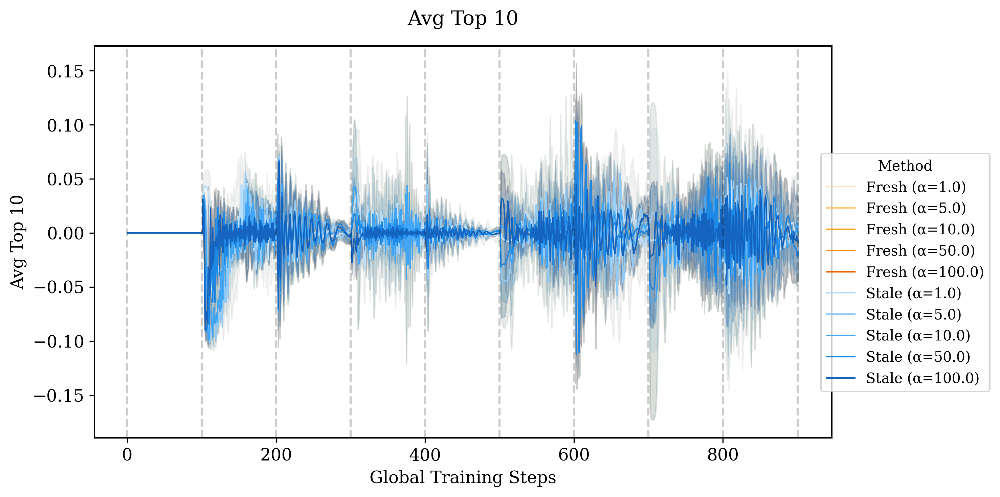

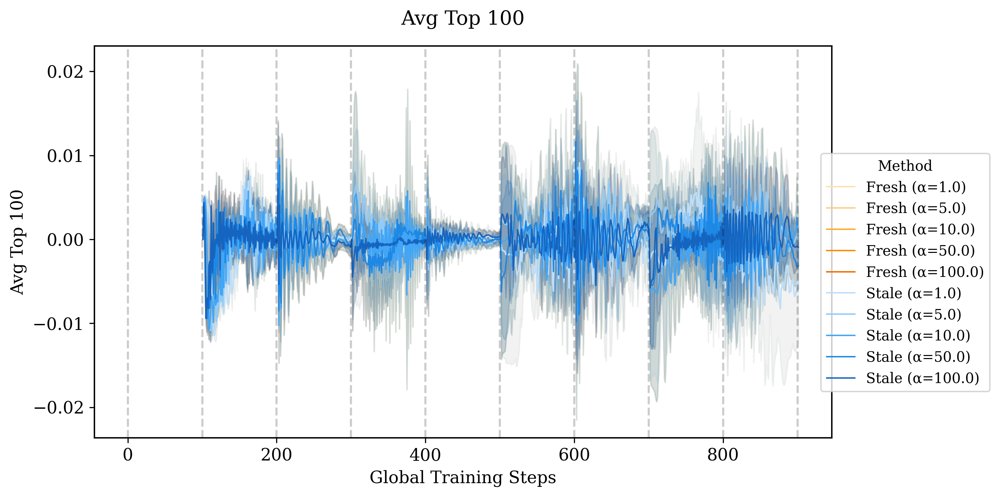

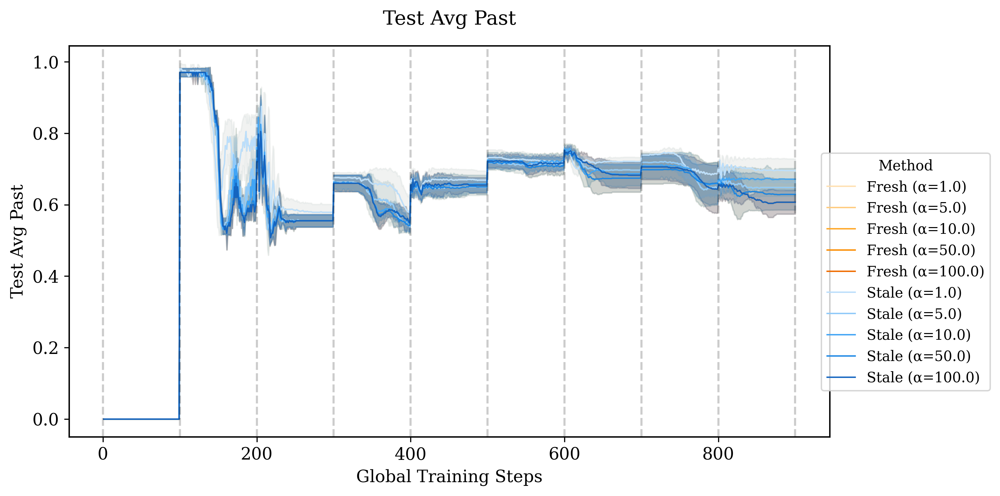

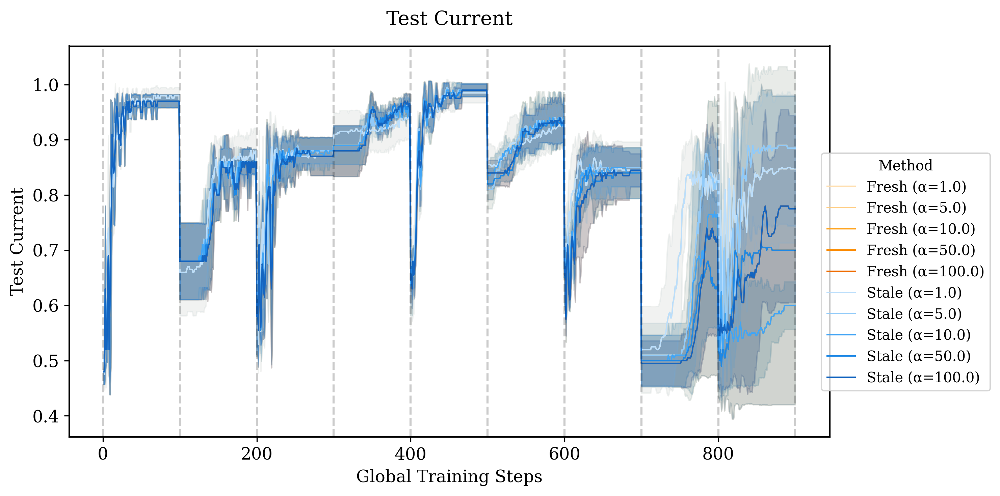

...

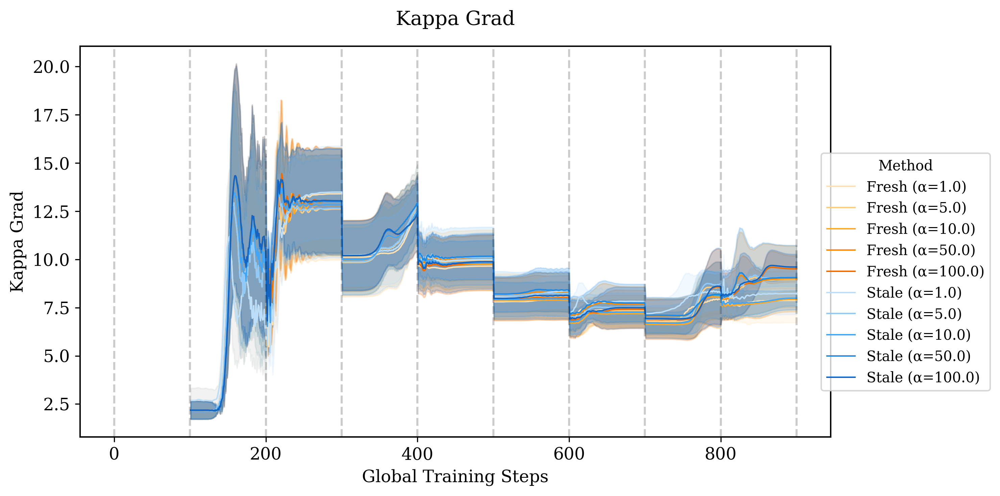

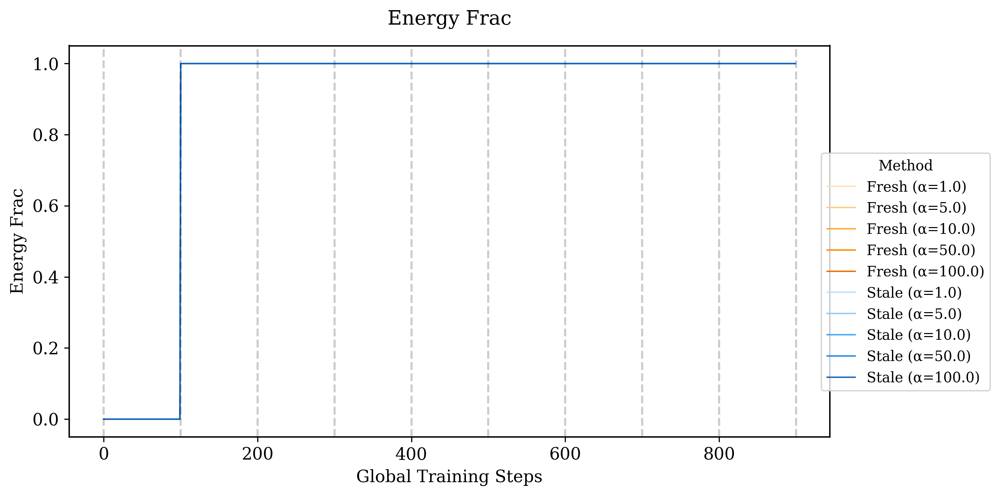

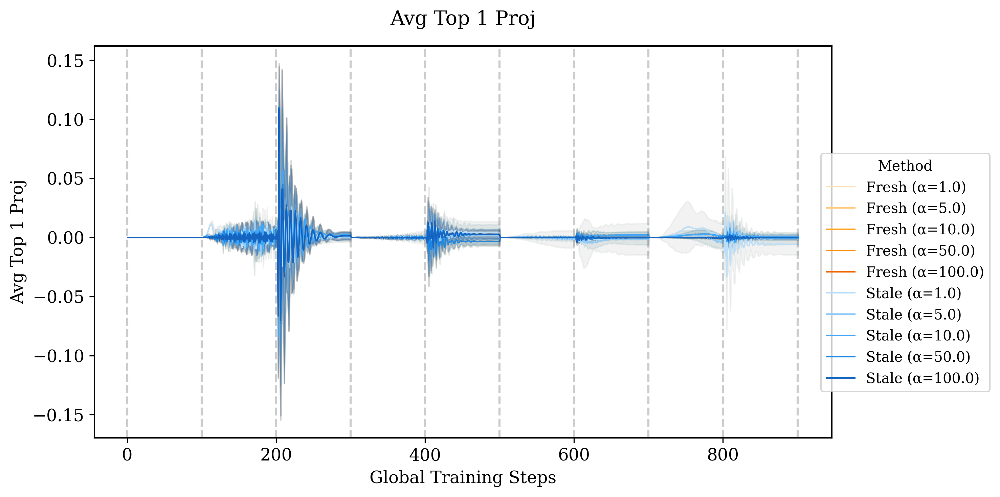

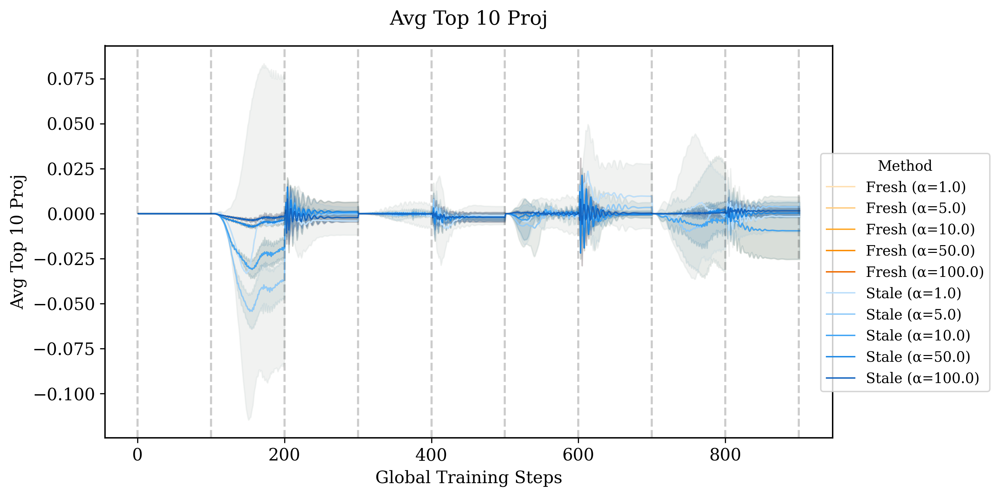

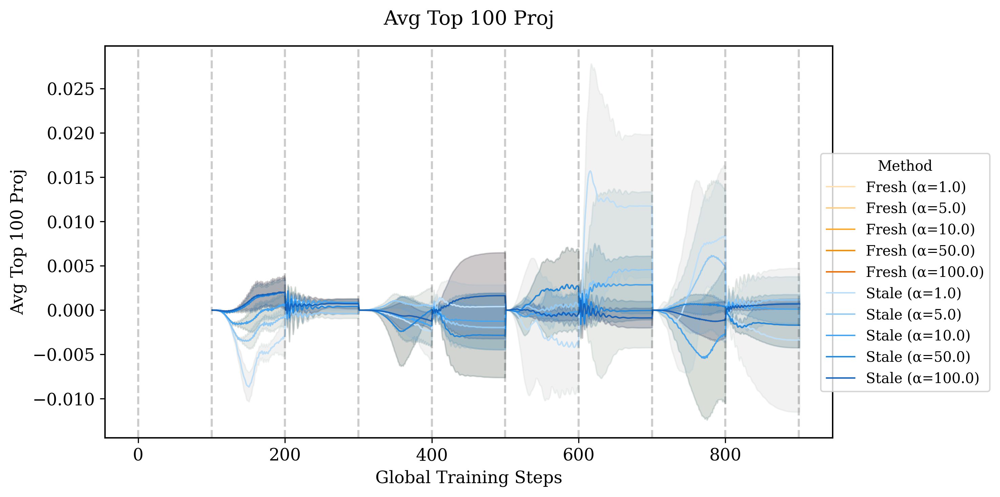

In [79]:
# metrics = ['train_avg_past', 'test_avg_past', 'train_current', 'test_current']
metrics = align_cols + perf_cols + proj_cols
# 4. Generate the Plots
# You can loop through your metrics to generate all 4 plots automatically

# Define a consistent color palette
palette = {
    # --- Fresh Approximations (Warm / Oranges) ---
    "Fresh (α=0.1)":   "#FFF3E0", # Very Light Orange
    "Fresh (α=1.0)":   "#FFE0B2", # Light Orange
    "Fresh (α=5.0)":   "#FFCC80", # Soft Orange
    "Fresh (α=10.0)":  "#FFA726", # Vibrant Orange
    "Fresh (α=50.0)":  "#FB8C00", # Dark Orange
    "Fresh (α=100.0)": "#EF6C00", # Deep Orange
    "Fresh (α=1000.0)":"#BF360C", # Burnt Red/Orange

    # --- Stale Approximations (Cool / Blues) ---
    "Stale (α=0.1)":   "#E3F2FD", # Very Light Blue
    "Stale (α=1.0)":   "#BBDEFB", # Light Blue
    "Stale (α=5.0)":   "#90CAF9", # Soft Blue
    "Stale (α=10.0)":  "#42A5F5", # Sky Blue
    "Stale (α=50.0)":  "#1E88E5", # Rich Blue
    "Stale (α=100.0)": "#1565C0", # Dark Blue
    "Stale (α=1000.0)":"#0D47A1"  # Navy Blue
}

plot_df = plot_df.sort_values(['approx_type', 'alpha'], ascending=[True, True])
for metric in metrics:
    readable_title = metric.replace('_', ' ').title()
    save_plot(
        df=plot_df, 
        y_metric=metric, 
        title=f'{readable_title}', 
        filename=f'figures/sweep_{metric}',
        steps_per_task=steps_per_task, 
        palette=palette
    )



# # Define a consistent color palette
# palette = {
#     'Sequential': "#b3c8a1", 
#     'Replay': "#7eb8e1", 
#     'Regularization': "#aa8bf1"
# }

# #3. Call the plotting function twice
# save_plot(
#     df=plot_df, 
#     y_metric='train_avg_past', 
#     title='Training Accuracy (Past)', 
#     filename='figures/past_train_accuracy',
#     steps_per_task=steps_per_task,
#     palette=palette
# )


# save_plot(
#     df=plot_df, 
#     y_metric='test_avg_past', 
#     title='Test Accuracy (Past)', 
#     filename='figures/past_test_accuracy',
#     steps_per_task=steps_per_task
# )

# save_plot(
#     df=plot_df, 
#     y_metric='train_current', 
#     title='Training Accuracy (Current)', 
#     filename='figures/current_train_accuracy',
#     steps_per_task=steps_per_task
# )

# save_plot(
#     df=plot_df, 
#     y_metric='test_current', 
#     title='Test Accuracy (Current)', 
#     filename='figures/current_test_accuracy',
#     steps_per_task=steps_per_task
# )

Indexing 229 experiments...


Filters: {'mode': 'regularized', 'reg_type': 'taylor-full', 'curvature': 'true_fisher', 'ignore_gradient': True}


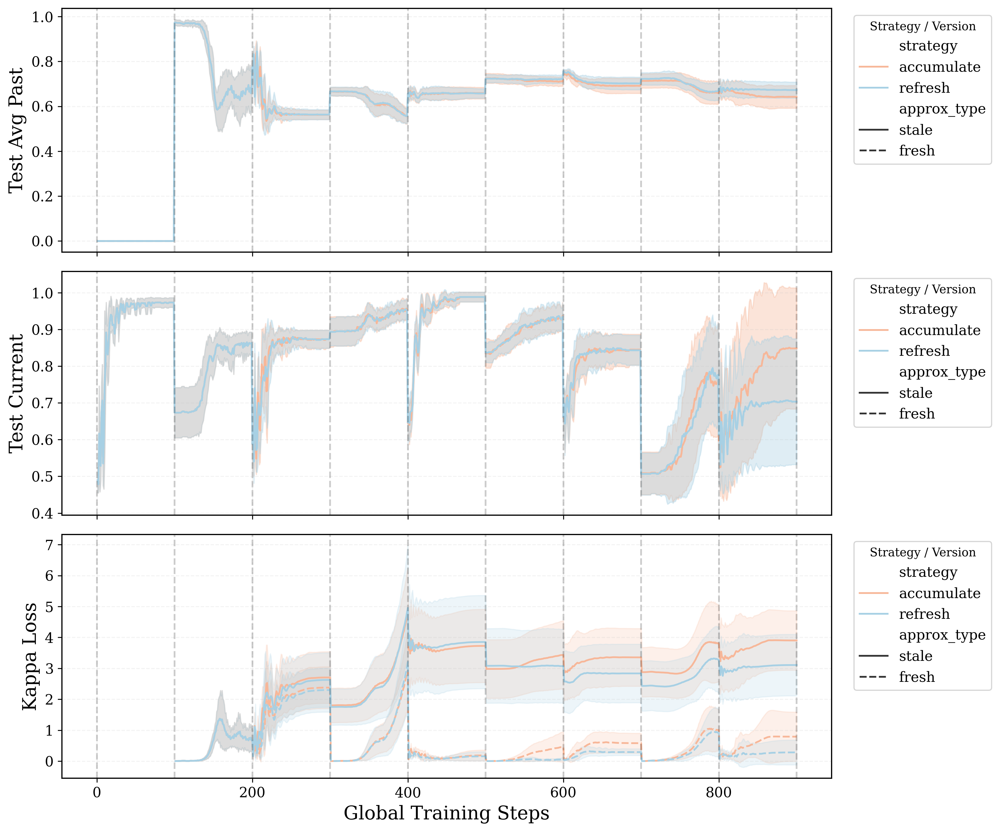

In [80]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_training_overview(root_dir, filters, metrics_to_plot=None):
    # 1. Define the metrics we want to correlate
    
    # 2. Collect Data (using our robust dictionary-based function)
    index = get_experiment_index(root_dir)
    relevant_exps = filter_index(index, filters)
    
    if not relevant_exps:
        print("No experiments found matching these filters.")
        return

    df = collect_results_to_df(relevant_exps, metrics_to_plot)

    # 3. Create Subplots (one row per metric)
    fig, axes = plt.subplots(len(metrics_to_plot), 1, figsize=(12, 10), sharex=True, dpi=300)
    
    # We compare by 'seed' or 'strategy' if there are multiple, 
    # but here we'll use 'strategy' as the primary color group
    compare_by = 'strategy' 

    for i, metric in enumerate(metrics_to_plot):
        ax = axes[i]
        
        # Absolute value for kappa metrics
        plot_df = df.copy()
        if 'kappa' in metric:
            plot_df[metric] = plot_df[metric].abs()

        sns.lineplot(
            data=plot_df,
            x='step',
            y=metric,
            hue=compare_by,
            style='approx_type', # Solid for stale, Dashed for fresh
            ax=ax,
            errorbar='sd',
            palette='RdBu'
        )

        # Formatting each subplot
        ax.set_ylabel(metric.replace('_', ' ').title())
        ax.grid(True, alpha=0.2)
        ax.legend(title='Strategy / Version', bbox_to_anchor=(1.02, 1), loc='upper left')
        
        # Task Boundary Lines
        num_steps = relevant_exps[0]['config']['num_steps']
        max_step = df['step'].max()
        for t_step in range(0, int(max_step) + 1, num_steps):
            ax.axvline(x=t_step, color='black', linestyle='--', alpha=0.2)

    plt.xlabel("Global Training Steps")
    print(f"Filters: {filters}")
    plt.tight_layout()
    plt.show()

# --- Execution ---
my_filters = {
    'mode': 'regularized',
    'reg_type': 'taylor-full',
    'curvature': 'true_fisher', 
    'ignore_gradient': True
}

plot_training_overview('./results', my_filters, 
    metrics_to_plot = ['test_avg_past', 'test_current', #'avg_reg_loss', 'avg_task_loss', \
                       'kappa_loss'])